<a href="https://colab.research.google.com/github/MuhammadRivaldiAsyhari/CBIR/blob/main/CBIR_corel.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [77]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!unzip /content/drive/MyDrive/cbir-tkcitra/pytorch-image-models-master.zip -d /content/drive/MyDrive/cbir-tkcitra/
!unzip /content/drive/MyDrive/cbir-tkcitra/archive_2.zip -d /content/drive/MyDrive/cbir-tkcitra/

In [ ]:
!pip install ipyplot
!pip install timm
!pip install opendatasets

In [78]:
from tqdm.notebook import tqdm
import numpy as np
# import pandas as pd
import matplotlib.pyplot as plt
# import seaborn as sns
import os
import gc
import glob
import pickle
from PIL import Image
import ipyplot

import torch
import torch.nn as nn
# import torch.nn.functional as F
# import torch.optim as optim
# from torch.optim.lr_scheduler import CosineAnnealingWarmRestarts
# from torch.utils.data import DataLoader,Dataset, random_split
from torchvision import utils
# from torchvision.models.feature_extraction import get_graph_node_names, create_feature_extractor

import sys
sys.path.append('/content/drive/MyDrive/cbir-tkcitra/pytorch-image-models-master')
import timm
import albumentations as A
from albumentations.pytorch import ToTensorV2
# from sklearn.metrics import classification_report, confusion_matrix
# from sklearn.model_selection import train_test_split as TTS

np.random.seed(7)
torch.manual_seed(7)

device='cuda' if torch.cuda.is_available() else 'cpu'
device

'cpu'

In [79]:
class pre_trained_model(nn.Module):
    
    def __init__(self, pretrained = True):
        super().__init__()
        self.model = timm.create_model('efficientnet_b0',pretrained = pretrained)
        
        for param in self.model.parameters():
            param.requires_grad = True            
        
        self.fc = nn.Sequential(
                                nn.Linear(1280*7*7, 1024),
                                nn.PReLU(),
                                nn.BatchNorm1d(1024),
                                nn.Dropout(p = 0.5),
        
                                nn.Linear(1024, 128),
                                nn.PReLU(),
                                nn.BatchNorm1d(128)
                                )
        self.head = nn.Linear(128, 10)
        
    def forward(self, x):
        x = self.model.forward_features(x)
        x = x.view(-1, 1280*7*7)
        features = self.fc(x)
        x = self.head(features)
        
        return features, x

In [80]:
model = pre_trained_model(pretrained = False).to(device)
PATH = '/content/drive/MyDrive/cbir-tkcitra/effnetB0_finetuned_statedict.pth'

if device == 'cuda':
    model.load_state_dict(torch.load(PATH))
else:
    model.load_state_dict(torch.load(PATH, map_location = torch.device('cpu')))

In [81]:
class Get_Dataset_Embeddings():
    
    def __init__(self, model):
        self.model = model
        self.model.eval()
        
    def return_embeddings(self, root_dir):
        path = root_dir
        img_paths_dict = self._get_img_paths_dict(path)
        img_paths_to_embeddings_dict = self._get_embeddings(img_paths_dict)

        return img_paths_to_embeddings_dict
            
    def _get_img_paths_dict(self, root_dir):
        root = root_dir
        all_img_paths = glob.glob(root + str('*/*'))

        class_map = {}
        class_distribution = {}

        for img_path in all_img_paths:
            class_name = img_path.split(os.sep)[-2]
            if class_name not in class_distribution:
                class_distribution[class_name] = 1
            else:
                class_distribution[class_name] +=1
        for index, entity in enumerate(class_distribution):
            class_map[entity] = index
        print("Dataset Distribution:\n")
        print(class_distribution)
        print("\n\nClass indices:\n")
        print(class_map)


        img_paths_dict = {}
        subdirs = glob.glob(root + str('*'))
        for i in tqdm(range(0,len(subdirs))):
            class_name = subdirs[i].split(os.sep)[-1]
            img_paths_dict[class_name] = glob.glob(root + str(f'{class_name}/*'))

        return img_paths_dict 
    
    
    def _preprocess_img(self, img):
        img_x = 224
        img_y = 224

        transforms = A.Compose(
                    [
                A.Resize(img_x, img_y),
                A.Normalize(
                    mean = (0.485, 0.456, 0.406),
                    std = (0.229, 0.224, 0.225),
                    max_pixel_value=255,
                ),
                ToTensorV2(),
                    ]
                )
        aug = transforms(image=img)
        img = aug['image']

        return img
    
    
    def _get_embeddings(self, img_paths_dict):
        img_paths_to_embeddings_dict = {}
        faulty_images = {}
        for key in img_paths_dict:
            faulty_images[key] = []
            img_paths_to_embeddings_dict[key] = []
            print(f"Embedding class:{key}")
            i = 0
            for path in tqdm(img_paths_dict[key]):
                image_PIL = Image.open(path)
                img = np.array(image_PIL)
                try:
                    img = self._preprocess_img(img).to(device)
                    img = img.view(1,3,224,224).to(device)
                    embedding = torch.squeeze(self.model(img)[0]).detach().cpu()
                    img_paths_to_embeddings_dict[key].append([path, embedding, image_PIL])
                except:
                    faulty_images[key].append(img)
                    
        return img_paths_to_embeddings_dict, faulty_images
        

In [ ]:
# embedding_obj = Get_Dataset_Embeddings(model)
# train_set_embeddings, train_faulty_images  = embedding_obj.return_embeddings(root_dir = "../input/corel-images/dataset/training_set/")

In [ ]:
# test_set_embeddings, test_faulty_images = embedding_obj.return_embeddings("../input/corel-images/dataset/test_set/")

In [ ]:
# embedding_obj = Get_Dataset_Embeddings(model)
# scraped_image_embeddings, faulty_images = embedding_obj.return_embeddings(root_dir = "../input/scraped-images-corel-testing/scraped_images/")

In [82]:
with open("/content/drive/MyDrive/cbir-tkcitra/test_set_embeddings.pickle", 'rb') as handle:
    test_set_embeddings = pickle.load(handle)
with open("/content/drive/MyDrive/cbir-tkcitra/train_set_embeddings.pickle", 'rb') as handle:
    train_set_embeddings = pickle.load(handle)

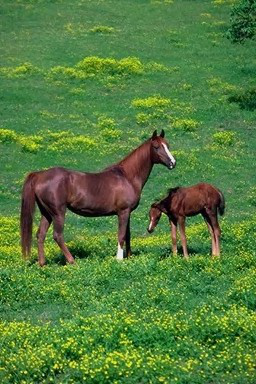

In [83]:
train_set_embeddings['horses'][0][2]

In [84]:
class Image_Retrieval():
    def __init__(self, query_img, model, embedded_dataset_dict):
        self.query_img = query_img
        self.model = model
        self.model.eval()
        self.embedded_dataset_dict = embedded_dataset_dict
        
    def _preprocess_img(self, img):
        if type(img) != 'numpy.ndarray':
            img = np.array(img)

        img_x = 224
        img_y = 224

        transforms = A.Compose(
                    [
                A.Resize(img_x, img_y),
                A.Normalize(
                    mean = (0.485, 0.456, 0.406),
                    std = (0.229, 0.224, 0.225),
                    max_pixel_value=255,
                ),
                ToTensorV2(),
                    ]
                )
        aug = transforms(image=img)
        img = aug['image'] 
        return img
    
    def _get_query_img_embedding(self, img_tensor):
        img_tensor = img_tensor.view(1,3,224,224).to(device)
        embedding = torch.squeeze(self.model(img_tensor)[0]).detach().cpu()
        return torch.unsqueeze(embedding,0) 
    
    def retrieve_img_paths(self):
        
        preprocessed_query_img = self._preprocess_img(self.query_img)
        query_img_embedding = self._get_query_img_embedding(preprocessed_query_img)
        
        distance_dict = {}
        pdist = torch.nn.PairwiseDistance(p=2)

        retrieved_img_paths = []
        retrieved_imgs = []

        for key in tqdm(self.embedded_dataset_dict):
            distance_dict[key] = []

            for index in self.embedded_dataset_dict[key]:
                search_img_embedding = index[1]
                search_img_embedding = torch.unsqueeze(search_img_embedding,0)
                distance = float(pdist(query_img_embedding, search_img_embedding))
                distance_dict[key].append(distance)
                if distance < 7:
                    retrieved_img_paths.append(index[0])
                    retrieved_imgs.append(index[2])

        return retrieved_img_paths, retrieved_imgs

## Retrieval Examples

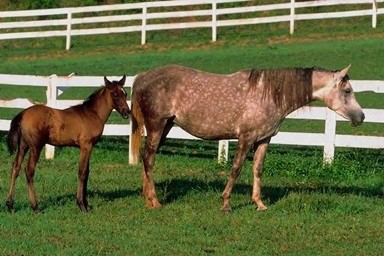

In [85]:
img_class = "horses"
query_img_path = f'/content/drive/MyDrive/cbir-tkcitra/dataset/test_set/{img_class}/{img_class}.jpg'
query_img = Image.open(query_img_path)
query_img

In [86]:
Image_Retriever = Image_Retrieval(query_img = query_img, 
                                  model = model, 
                                  embedded_dataset_dict = test_set_embeddings)

retrieved_img_paths, retrieved_imgs = Image_Retriever.retrieve_img_paths()

  0%|          | 0/4 [00:00<?, ?it/s]


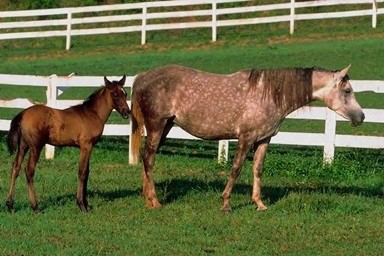
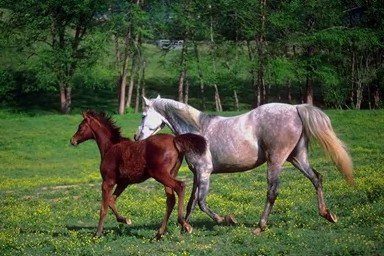
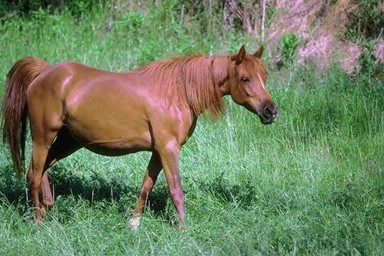
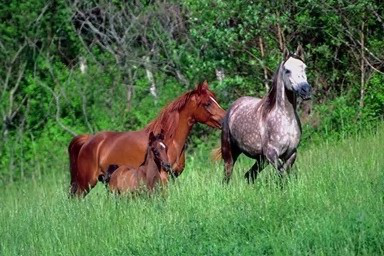
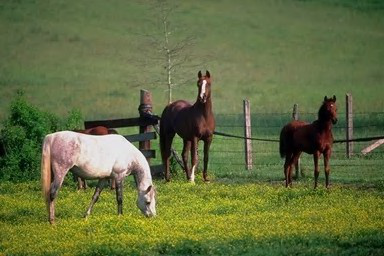
...
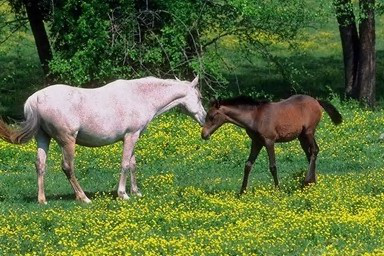
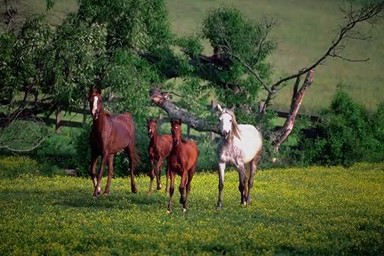
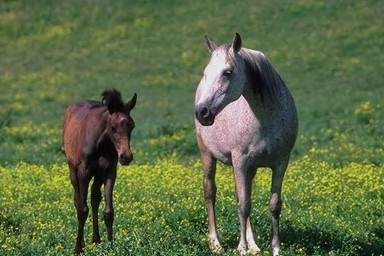
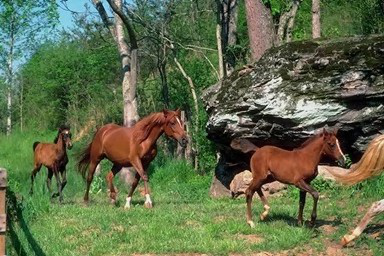
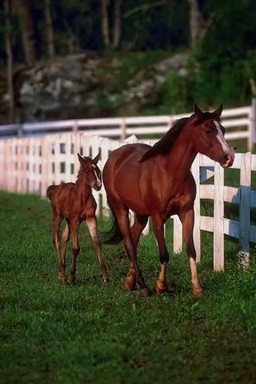

In [87]:
ipyplot.plot_images(retrieved_imgs)

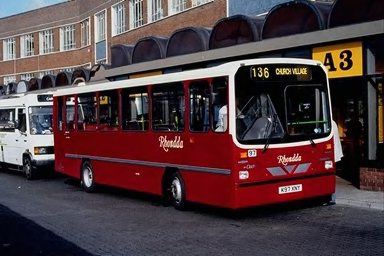

In [88]:
img_class = "bus"
query_img_path = f'/content/drive/MyDrive/cbir-tkcitra/dataset/test_set/{img_class}/{img_class}.jpg'
query_img = Image.open(query_img_path)
query_img

In [89]:
Image_Retriever = Image_Retrieval(query_img = query_img, 
                                  model = model, 
                                  embedded_dataset_dict = test_set_embeddings)

retrieved_img_paths, retrieved_imgs = Image_Retriever.retrieve_img_paths()

  0%|          | 0/4 [00:00<?, ?it/s]


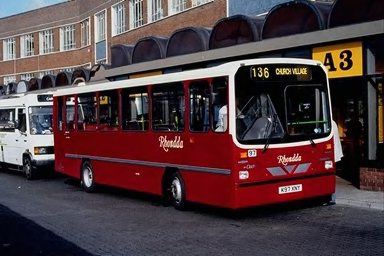
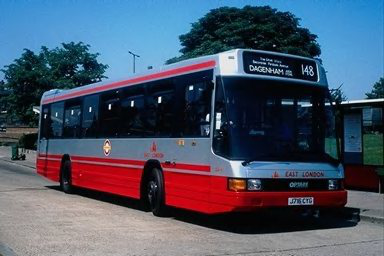
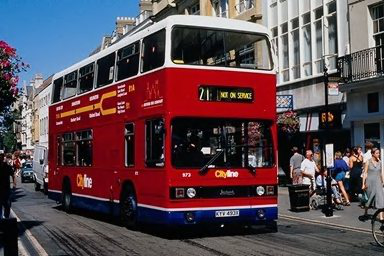
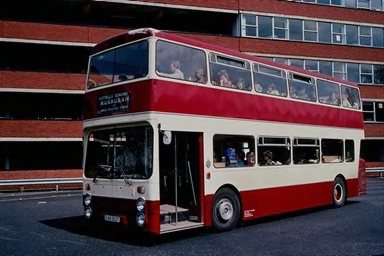
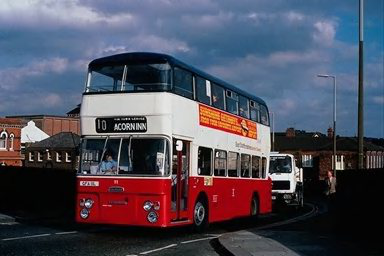
...
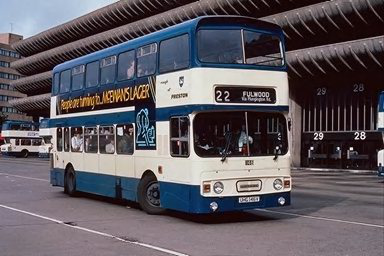
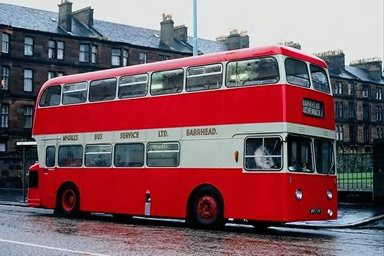
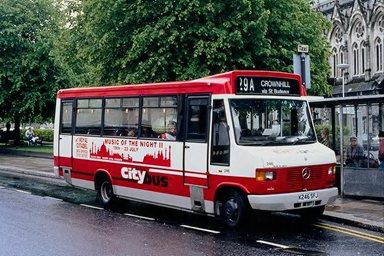
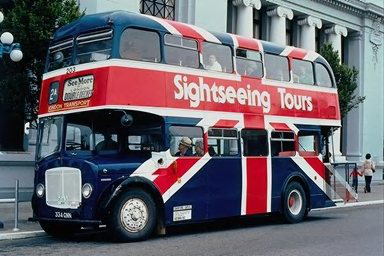
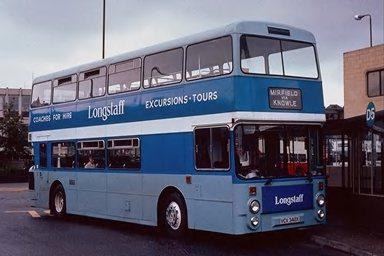

In [90]:
ipyplot.plot_images(retrieved_imgs)

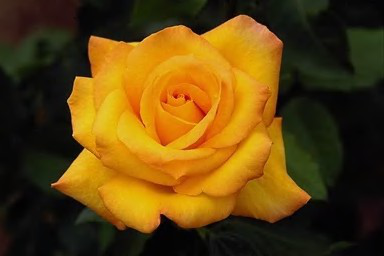

In [91]:
img_class = "flowers"
query_img_path = f'/content/drive/MyDrive/cbir-tkcitra/dataset/test_set/{img_class}/{img_class}.jpg'
query_img = Image.open(query_img_path)
query_img


In [92]:
Image_Retriever = Image_Retrieval(query_img = query_img, 
                                  model = model, 
                                  embedded_dataset_dict = test_set_embeddings)

retrieved_img_paths, retrieved_imgs = Image_Retriever.retrieve_img_paths()

  0%|          | 0/4 [00:00<?, ?it/s]


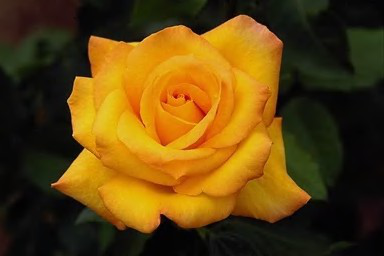
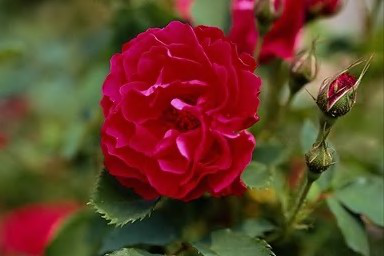
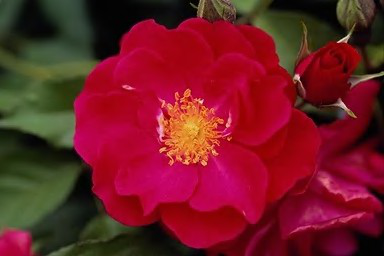
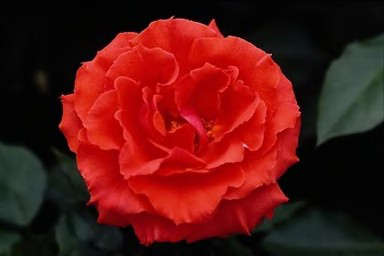
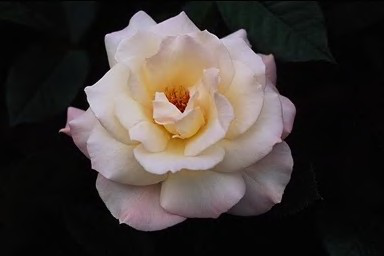
...
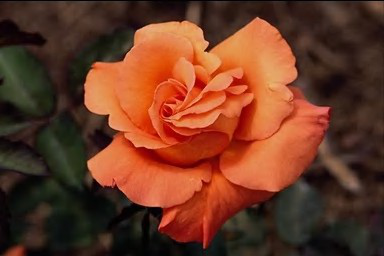
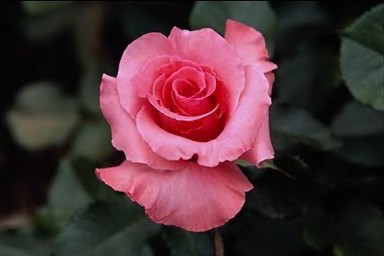
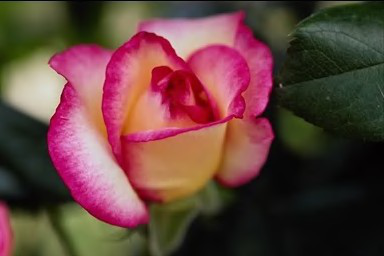
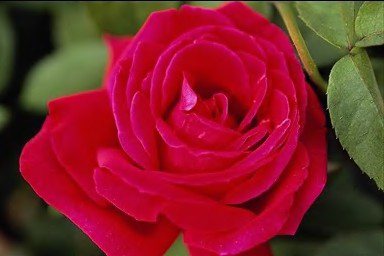
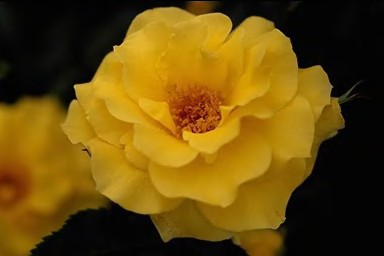

In [93]:
ipyplot.plot_images(retrieved_imgs)

## Performance in Training Set

In [94]:
def performance_testing(img_class, model, database_image_embeddings):
    query_img_path = f'/content/drive/MyDrive/cbir-tkcitra/dataset/test_set/{img_class}/{img_class}.jpg'
    query_img = Image.open(query_img_path)
    Image_Retriever = Image_Retrieval(query_img = query_img, 
                                  model = model, 
                                  embedded_dataset_dict = database_image_embeddings)

    retrieved_img_paths, retrieved_imgs = Image_Retriever.retrieve_img_paths()
    
    pred_dict = {}
    for path in retrieved_img_paths:
        key = path.split(os.sep)[-2]
        if key not in pred_dict:
            pred_dict[key] = 1
        else:
            pred_dict[key] += 1
            
    return pred_dict

In [95]:
train_corel_performance_dict = {}
for key in tqdm(train_set_embeddings):
    if 'bus' in key:
        key = 'bus'
    train_corel_performance_dict[key] = performance_testing(key, model, train_set_embeddings)

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

In [96]:
train_corel_performance_dict

{'horses': {'horses': 90},
 'flowers': {'flowers': 90},
 'bus': {'bus': 90},
 'dinosaurs': {'dinosaurs': 84}}

In [97]:
train_corel_class_wise_performance = {}

for class_name in train_corel_performance_dict:
    train_corel_class_wise_performance[class_name] = {}

    correct = 0
    false = 0
    
    for key in train_corel_performance_dict[class_name]:
        if 'bus' in class_name and 'bus' in key:
            correct += train_corel_performance_dict[class_name][key]
            continue
            
        if key == class_name:
            correct += train_corel_performance_dict[class_name][key]
        else:
            false += train_corel_performance_dict[class_name][key]
            
    train_corel_class_wise_performance[class_name]["correct"] = correct
    train_corel_class_wise_performance[class_name]["false"] = false

In [98]:
train_corel_class_wise_performance

{'horses': {'correct': 90, 'false': 0},
 'flowers': {'correct': 90, 'false': 0},
 'bus': {'correct': 90, 'false': 0},
 'dinosaurs': {'correct': 84, 'false': 0}}

In [99]:
train_corel_class_wise_accuracy = {}

for key in train_corel_class_wise_performance:
    
    correct = train_corel_class_wise_performance[key]["correct"]
    false =  train_corel_class_wise_performance[key]["false"]
    acc = (correct/(correct + false)) * 100
    
    train_corel_class_wise_accuracy[key] = acc
    
train_corel_class_wise_accuracy

{'horses': 100.0, 'flowers': 100.0, 'bus': 100.0, 'dinosaurs': 100.0}

## Performance in Test Set

In [100]:
test_corel_performance_dict = {}
for key in tqdm(test_set_embeddings):
    if 'bus' in key:
        key = 'bus'
    test_corel_performance_dict[key] = performance_testing(key, model, test_set_embeddings)

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

In [101]:
test_corel_performance_dict

{'dinosaurs': {'dinosaurs': 10},
 'flowers': {'flowers': 10},
 'bus': {'bus': 10},
 'horses': {'horses': 10}}

In [102]:
test_corel_class_wise_performance = {}

for class_name in test_corel_performance_dict:
    test_corel_class_wise_performance[class_name] = {}

    correct = 0
    false = 0
    
    for key in test_corel_performance_dict[class_name]:
        if 'people' in class_name and 'peolpe' in key:
            correct += test_corel_performance_dict[class_name][key]
            continue
            
        if key == class_name:
            correct += test_corel_performance_dict[class_name][key]
        else:
            false += test_corel_performance_dict[class_name][key]
            
    test_corel_class_wise_performance[class_name]["correct"] = correct
    test_corel_class_wise_performance[class_name]["false"] = false
    
test_corel_class_wise_performance

{'dinosaurs': {'correct': 10, 'false': 0},
 'flowers': {'correct': 10, 'false': 0},
 'bus': {'correct': 10, 'false': 0},
 'horses': {'correct': 10, 'false': 0}}

In [103]:
test_corel_class_wise_accuracy = {}

for key in test_corel_class_wise_performance:
    
    correct = test_corel_class_wise_performance[key]["correct"]
    false =  test_corel_class_wise_performance[key]["false"]
    acc = (correct/(correct + false)) * 100
    
    test_corel_class_wise_accuracy[key] = acc
    
test_corel_class_wise_accuracy

{'dinosaurs': 100.0, 'flowers': 100.0, 'bus': 100.0, 'horses': 100.0}